In [1]:
import matplotlib.pyplot as plt
import IPython.display as ipd
import pandas as pd
import librosa
import keras
import librosa.display
%pylab inline
import glob

ipd.Audio('(ANALYSIS)sleep-party-people-im-not-human-at-all.mp3')


Using TensorFlow backend.


Populating the interactive namespace from numpy and matplotlib


In [9]:
data, sam_rate = librosa.load('(ANALYSIS)sleep-party-people-im-not-human-at-all.mp3')

In [4]:
tempo, beats = librosa.beat.beat_track(data, sr=sam_rate, units='time')
librosa.output.times_csv('beat_times_whole.csv', beats)


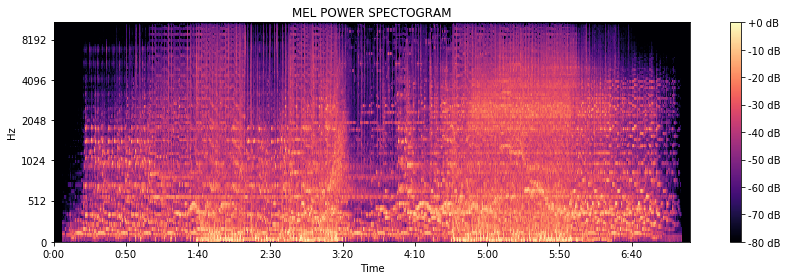

In [5]:
D = np.abs(librosa.stft(data))**2
S = librosa.feature.melspectrogram(data,sr=sam_rate,S=D,n_mels=128)
log_S = librosa.power_to_db(S,ref=np.max)

plt.figure(figsize=(12,4))
librosa.display.specshow(log_S,sr=sam_rate,x_axis='time',y_axis='mel')
plt.title('MEL POWER SPECTOGRAM')

plt.colorbar(format='%+02.0f dB')

plt.tight_layout()

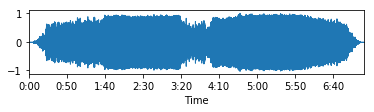

In [6]:
plt.subplot(3,1,3)
librosa.display.waveplot(data, sr=sam_rate)
data_harm, data_perc = librosa.effects.hpss(data)

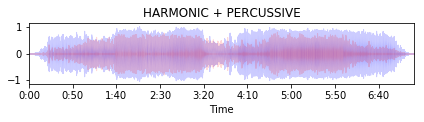

In [8]:
plt.subplot(3,1,3)
librosa.display.waveplot(data_harm,color='b',sr=sam_rate,alpha=.2)
librosa.display.waveplot(data_perc,color='r',sr=sam_rate,alpha=.15)
plt.title('HARMONIC + PERCUSSIVE')
plt.tight_layout()

In [9]:
tempo_harm, beats_harm = librosa.beat.beat_track(data_harm, sr=sam_rate, units='time')
librosa.output.times_csv('beat_times_harm.csv', beats_harm)

tempo_perc, beats_perc = librosa.beat.beat_track(data_perc, sr=sam_rate, units='time')
librosa.output.times_csv('beat_times_perc.csv', beats_perc)

In [21]:
harm_mel = librosa.feature.melspectrogram(data_harm,sr=sam_rate)
perc_mel = librosa.feature.melspectrogram(data_perc,sr=sam_rate)

log_Sh = librosa.power_to_db(harm_mel,ref=np.max)
log_Sp = librosa.power_to_db(perc_mel,ref=np.max)

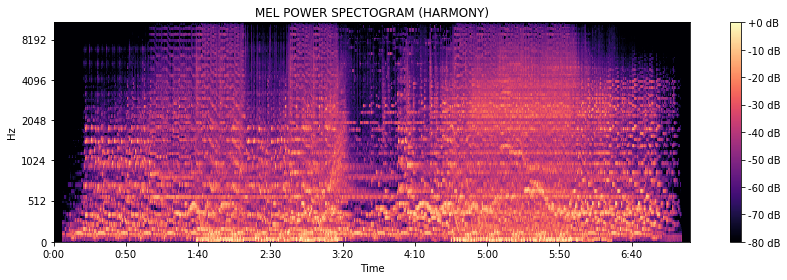

In [11]:
plt.figure(figsize=(12,4))
librosa.display.specshow(log_Sh,sr=sam_rate,x_axis='time',y_axis='mel')
plt.title('MEL POWER SPECTOGRAM (HARMONY)')

plt.colorbar(format='%+02.0f dB')

plt.tight_layout()

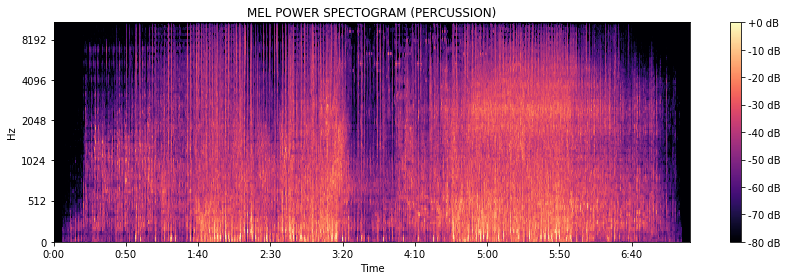

In [12]:
plt.figure(figsize=(12,4))
librosa.display.specshow(log_Sp,sr=sam_rate,x_axis='time',y_axis='mel')
plt.title('MEL POWER SPECTOGRAM (PERCUSSION)')

plt.colorbar(format='%+02.0f dB')

plt.tight_layout()

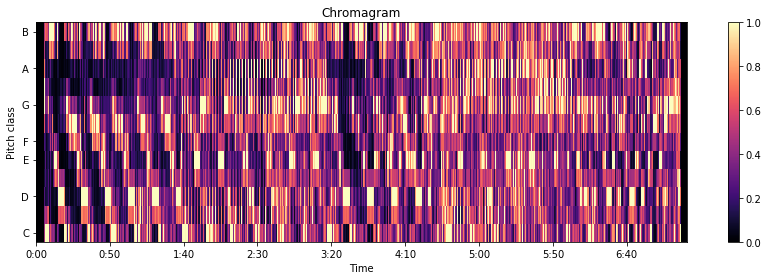

In [13]:
C = librosa.feature.chroma_cqt(data_harm,sr=sam_rate)
plt.figure(figsize=(12,4))
librosa.display.specshow(C,sr=sam_rate,x_axis='time',y_axis='chroma',vmin=0,vmax=1)
plt.title('Chromagram')
plt.colorbar()

plt.tight_layout()

In [56]:
N = librosa.estimate_tuning(log_Sh,sr=sam_rate,S=C)
display(N)

-0.14999999999999997

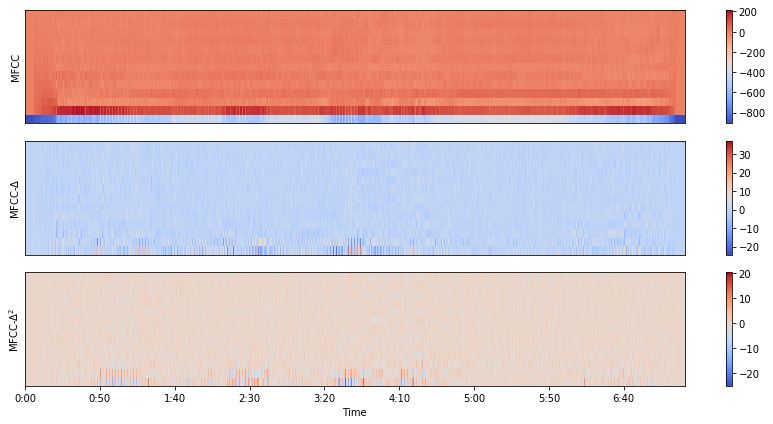

In [14]:

# Next, we'll extract the top 13 Mel-frequency cepstral coefficients (MFCCs)
mfcc        = librosa.feature.mfcc(S=log_S, n_mfcc=13)

# Let's pad on the first and second deltas while we're at it
delta_mfcc  = librosa.feature.delta(mfcc)
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

# How do they look?  We'll show each in its own subplot
plt.figure(figsize=(12, 6))

plt.subplot(3,1,1)
librosa.display.specshow(mfcc)
plt.ylabel('MFCC')
plt.colorbar()

plt.subplot(3,1,2)
librosa.display.specshow(delta_mfcc)
plt.ylabel('MFCC-$\Delta$')
plt.colorbar()

plt.subplot(3,1,3)
librosa.display.specshow(delta2_mfcc, sr=sam_rate, x_axis='time')
plt.ylabel('MFCC-$\Delta^2$')
plt.colorbar()

plt.tight_layout()

# For future use, we'll stack these together into one matrix
M = np.vstack([mfcc, delta_mfcc, delta2_mfcc])

<Figure size 864x432 with 0 Axes>

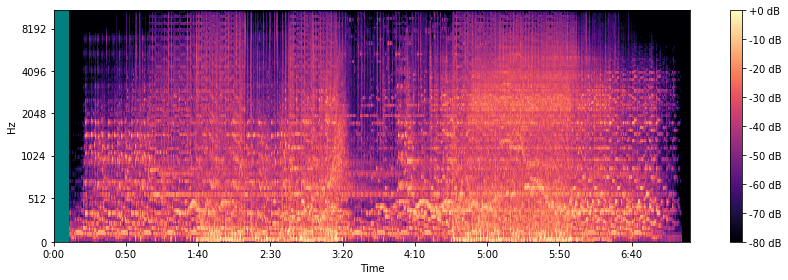

In [15]:
plt.figure(figsize=(12, 6))
tempo_perc, beats_perc = librosa.beat.beat_track(data_perc, sr=sam_rate, units='time')
librosa.output.times_csv('beat_times_perc.csv', beats_perc)

plt.figure(figsize=(12,4))
librosa.display.specshow(log_S, sr=sam_rate, x_axis='time', y_axis='mel')


plt.vlines(librosa.frames_to_time(beats_perc),
           1, 0.5 * sam_rate,
           colors='teal', linestyles='-', linewidth=2, alpha=0.5)

plt.axis('tight')

plt.colorbar(format='%+02.0f dB')

plt.tight_layout()

In [18]:
print('Estimated tempo:        %.2f BPM' % tempo_perc)

print('First 5 beat frames:   ', beats_perc[:5])

# Frame numbers are great and all, but when do those beats occur?
print('First 5 beat times:    ', librosa.frames_to_time(beats_perc[:5], sr=sam_rate))

# We could also get frame numbers from times by librosa.time_to_frames()

Estimated tempo:        117.45 BPM
First 5 beat frames:    [20.92117914 21.43201814 21.91963719 22.40725624 22.94131519]
First 5 beat times:     [0.48575964 0.49764172 0.50893424 0.52027211 0.53265306]


array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)